In [1]:
import time
import random
random.seed(161)
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Python Crash Course IDSP 2025 - Lecture 09

* Very quick pandas recap
* Binary search recap
* Writing your own modules
* Timing your code with the `time` module and with Jupyter notebook cell magic
* Monte Carlo simulations: approximating $\pi$ with Python 😱
* If we get to it: package management with `conda`

***
## `pandas` recap & additional info:

**SettingWithCopyWarning**

... and how to debug

In [2]:
# run this cell to create a data frame...
df = pd.DataFrame(
    {
        "name": ["Agatha", "Bodi", "Ché", "Diallo", "Evelyn"],
        "favourite_color": ["black", "blue", "yellow", "red", "orange"],
        "is_student": [True, False, False, True, True]
    }
)
df.head()

,name,favourite_color,is_student
0,Agatha,black,True
1,Bodi,blue,False
2,Ché,yellow,False
3,Diallo,red,True
4,Evelyn,orange,True


In [5]:
# let's add a column, "is_itu_student"...
df["is_itu_student"] = None
df
# and let's assume Agatha and Diallo are ITU students:
#df[df["name"].isin(["Agatha", "Diallo"])] # for these rows, we want is_itu_student=True
#df[df["name"].isin(["Agatha", "Diallo"])]["is_itu_student"] # so we need to set all these values to True
#df[df["name"].isin(["Agatha", "Diallo"])]["is_itu_student"] = True
#df.head() # why didn't it work?

,name,favourite_color,is_student,is_itu_student
0,Agatha,black,True,None
1,Bodi,blue,False,None
2,Ché,yellow,False,None
3,Diallo,red,True,None
4,Evelyn,orange,True,None


# Try it out yourself!

This line of code 

```python
df[df["name"].isin(["Agatha", "Diallo"])]["is_itu_student"] = True
```

raised this error message:
```
SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead
See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
```

Use the documentation (link in error message!) & google/StackOverflow to figure out how to *correct* the line of code.

In [11]:
# YOUR DEBUGGED CODE HERE
# instead of: df[df["name"].isin(["Agatha", "Diallo"])]["is_itu_student"] = True
# ...
df.loc[df["name"].isin(["Agatha", "Diallo"]), "is_itu_student"] = True
df.head()

,name,favourite_color,is_student,is_itu_student
0,Agatha,black,True,True
1,Bodi,blue,False,None
2,Ché,yellow,False,None
3,Diallo,red,True,True
4,Evelyn,orange,True,None


# Binary search recap + new stuff + old stuff

* **Step 1:** Generate a `.txt` file with of 1000 random numbers from 1 to 1.000.000.
* **Step 2:** Write a function `binary_search` that performs a binary search on a sorted list.
* **Step 3:** Create a module that contains the `binary_search` function.
* **Step 4:** Time your code to check whether binary search is indeed faster than iterative search.

# Binary search recap + <mark style="background-color: lightblue">**new stuff**</mark> + old stuff

* **Step 1:** Generate a `.txt` file with of 1.000.000 random numbers from 1 to 1.000.000.000
* **Step 2:** Write a function `binary_search` that performs a binary search on a sorted list.
* **Step 3:** <mark style="background-color: lightblue">**Create a module**</mark> that contains the `binary_search` function.
* **Step 4:** <mark style="background-color: lightblue">**Time your code**</mark> to check whether binary search is indeed faster than iterative search.

# Binary search recap

### Step 1: Generate a `.txt` file with 1.000.000 random numbers from 1 to 1.000.000.000

In [12]:
# what happens in the code?
random_numbers = random.choices(
    range(1,10**9+1),
    k = 10**6
)
random_numbers = sorted(random_numbers)
with open("numbers.txt", "w") as opened_file:
    for number in random_numbers:
        opened_file.writelines(str(number)+"\n")

In [13]:
# what happens in the code?
del random_numbers
with open("numbers.txt", "r") as opened_file:
    lines = opened_file.read()
lines

'258\n669\n1985\n2641\n4155\n4860\n6436\n7625\n9111\n10053\n11035\n11316\n11343\n15380\n15757\n15804\n16054\n16522\n17515\n19752\n21617\n21933\n21971\n22304\n23555\n25830\n25934\n28363\n28846\n28918\n29625\n31066\n32231\n32936\n33643\n34357\n35555\n35965\n36612\n37008\n38079\n38341\n41398\n43516\n43643\n44928\n48342\n48688\n48906\n49088\n50124\n51934\n52173\n52925\n53070\n53798\n55078\n55541\n56186\n56408\n57201\n57664\n58404\n59444\n59506\n61350\n61813\n62298\n63073\n63145\n63242\n63847\n64594\n66586\n66760\n68005\n68372\n68736\n70213\n70311\n70569\n71119\n72290\n73033\n73867\n75109\n75965\n76878\n77632\n77833\n78063\n81917\n82509\n84095\n87093\n87629\n87763\n89306\n90231\n91670\n92114\n92212\n93081\n93709\n96070\n96295\n96686\n97860\n99415\n100611\n102448\n105490\n105710\n105770\n105818\n106084\n108415\n111715\n112567\n112786\n112845\n113605\n113713\n114801\n115351\n115413\n115913\n116070\n116502\n116957\n117334\n117904\n118099\n118564\n118745\n119499\n119779\n119795\n120350\n122946\

In [14]:
# what happens in the code?
lines = lines.split("\n")
lines.remove("")
numbers = [int(item) for item in lines]
del lines
numbers

[258,
 669,
 1985,
 2641,
 4155,
 4860,
 6436,
 7625,
 9111,
 10053,
 11035,
 11316,
 11343,
 15380,
 15757,
 15804,
 16054,
 16522,
 17515,
 19752,
 21617,
 21933,
 21971,
 22304,
 23555,
 25830,
 25934,
 28363,
 28846,
 28918,
 29625,
 31066,
 32231,
 32936,
 33643,
 34357,
 35555,
 35965,
 36612,
 37008,
 38079,
 38341,
 41398,
 43516,
 43643,
 44928,
 48342,
 48688,
 48906,
 49088,
 50124,
 51934,
 52173,
 52925,
 53070,
 53798,
 55078,
 55541,
 56186,
 56408,
 57201,
 57664,
 58404,
 59444,
 59506,
 61350,
 61813,
 62298,
 63073,
 63145,
 63242,
 63847,
 64594,
 66586,
 66760,
 68005,
 68372,
 68736,
 70213,
 70311,
 70569,
 71119,
 72290,
 73033,
 73867,
 75109,
 75965,
 76878,
 77632,
 77833,
 78063,
 81917,
 82509,
 84095,
 87093,
 87629,
 87763,
 89306,
 90231,
 91670,
 92114,
 92212,
 93081,
 93709,
 96070,
 96295,
 96686,
 97860,
 99415,
 100611,
 102448,
 105490,
 105710,
 105770,
 105818,
 106084,
 108415,
 111715,
 112567,
 112786,
 112845,
 113605,
 113713,
 114801,
 115

# Binary search recap (cf. slides from last lecture!)

### Step 2: Write a function that performs a binary search on a sorted list.

```python

def binary_search(my_item, my_sorted_list):

    # define the initial search limits
    lower_limit = 0
    upper_limit = len(my_sorted_list) - 1

    # while we still have a list with more than 1 number to search:
    while lower_limit <= upper_limit:
    
        middle_index = (lower_limit + upper_limit) // 2

        if my_sorted_list[middle_index] == my_item: # if we found the item,
            return True, middle_index
        elif my_sorted_list[middle_index] < my_item: # if item is SMALLERTHAN,
            lower_limit = middle_index + 1 # change lower limit
        elif my_sorted_list[middle_index] > my_item: # if item is LARGERTHAN,
            upper_limit = middle_index - 1 # change upper limit
        else:
            raise ValueError("This should not be happening")

    return False, None
```

In [15]:
def binary_search(my_item, my_sorted_list):
    '''
    function that uses the binary search algorithm
    to find whether my_item is in my_list,
    and if so, in which position.
    returns: 
        (True, listindex) if item is in list;
        (False, None) otherwise
    '''

    # define the initial search limits
    lower_limit = 0
    upper_limit = len(my_sorted_list) - 1

    # while we still have a list with more than 1 number to search:
    while lower_limit <= upper_limit:
    
        middle_index = (lower_limit + upper_limit) // 2

        if my_sorted_list[middle_index] == my_item: # if we found the item,
            return True, middle_index
        elif my_sorted_list[middle_index] < my_item: # if item is SMALLERTHAN,
            lower_limit = middle_index + 1 # change lower limit
        elif my_sorted_list[middle_index] > my_item: # if item is LARGERTHAN,
            upper_limit = middle_index - 1 # change upper limit
        else:
            raise ValueError("This should not be happening")

    return False, None

# Binary search recap

### Step 3: Create a module that contains the `binary_search` function.

***

# Writing your own modules - quick intro

1. Make a `<filename>.py` file in the same folder as your notebook.
2. Define some function(s) inside of the `.py` file.
3. Now you can import all of these functions as a module: 

```python
import <filename>
```

### Try it out yourself!

1. Make a `mymodule.py` file in the same folder as your notebook.
2. Copy-paste the `binary_search()` function definition into the `mymodule.py` file.
3. Import the module you just created by running:

```python
import mymodule
```

4. Run the cell below to perform a binary search...

In [16]:
# binary search cell
import mymodule
print(mymodule.binary_search(888816, numbers))
print(mymodule.binary_search(141196, numbers))

(False, None)
(True, 161)


***

# Timing your code - quick intro

Binary search fun last time,
* Takeaway 1: searching a sorted list is much faster!
* Takeaway 2: binary search is much faster than checking every item!

But **how much** faster?

```python
import time # import the time module
time.time() # gives you the time RIGHT NOW in seconds
# time.time_ns() # if you want to be VERY precise
```

**fun fact:** When did [(Unix) time](https://en.wikipedia.org/wiki/Unix_time) start? January 1st, 1970!

In [17]:
# time since unix time in seconds
time.time()

1758633528.5506716

In [18]:
# time right now
time1 = time.time()
time1

1758633530.8415427

In [19]:
# time right now, again (at a later moment)
time2 = time.time()
time2

1758633532.8343897

In [20]:
# compute the difference
print("Time that passed in seconds: ", time2 - time1)

Time that passed in seconds:  1.992846965789795


In [21]:
# time.time() gives you seconds, as float; to avoid float imprecisions:
# time.time_ns() gives you nanoseconds, as integer
time1 = time.time_ns()
time2 = time.time_ns()
# compute the difference
print(f"time1: {time1}")
print(f"time2: {time2}")
print("Time that passed in NANOseconds: ", time2 - time1)

time1: 1758633601054499654
time2: 1758633601054580844
Time that passed in NANOseconds:  81190


# Binary search recap

### Step 4: Time your code to check whether binary search is indeed faster than iterative search.

In [22]:
# we already have generated a long list of random numbers:
numbers

[258,
 669,
 1985,
 2641,
 4155,
 4860,
 6436,
 7625,
 9111,
 10053,
 11035,
 11316,
 11343,
 15380,
 15757,
 15804,
 16054,
 16522,
 17515,
 19752,
 21617,
 21933,
 21971,
 22304,
 23555,
 25830,
 25934,
 28363,
 28846,
 28918,
 29625,
 31066,
 32231,
 32936,
 33643,
 34357,
 35555,
 35965,
 36612,
 37008,
 38079,
 38341,
 41398,
 43516,
 43643,
 44928,
 48342,
 48688,
 48906,
 49088,
 50124,
 51934,
 52173,
 52925,
 53070,
 53798,
 55078,
 55541,
 56186,
 56408,
 57201,
 57664,
 58404,
 59444,
 59506,
 61350,
 61813,
 62298,
 63073,
 63145,
 63242,
 63847,
 64594,
 66586,
 66760,
 68005,
 68372,
 68736,
 70213,
 70311,
 70569,
 71119,
 72290,
 73033,
 73867,
 75109,
 75965,
 76878,
 77632,
 77833,
 78063,
 81917,
 82509,
 84095,
 87093,
 87629,
 87763,
 89306,
 90231,
 91670,
 92114,
 92212,
 93081,
 93709,
 96070,
 96295,
 96686,
 97860,
 99415,
 100611,
 102448,
 105490,
 105710,
 105770,
 105818,
 106084,
 108415,
 111715,
 112567,
 112786,
 112845,
 113605,
 113713,
 114801,
 115

In [23]:
# Iterative search with a for-loop
my_number = 12345
number_was_found = False
t_start = time.time()
for item in numbers:
    if item==my_number:
        print("Found it!")
        number_was_found = True
        break
t_finish = time.time()
print(f"Number was found: {number_was_found}")

# Computing runtime
t_iterative = t_finish - t_start
print("Iterative search: ", t_iterative, "seconds")
print(f"In nanoseconds: {round(t_iterative*10**9)}")

Number was found: False
Iterative search:  0.07062697410583496 seconds
In nanoseconds: 70626974


In [24]:
# Iterative search with the "in" keyword
t_start = time.time()
number_was_found = my_number in numbers # True or False?
t_finish = time.time()
print(f"Number was found: {number_was_found}")

# Computing runtime
t_keyword = t_finish - t_start
print("Keyword search:", t_keyword, "seconds")
print(f"In nanoseconds: {round(t_keyword*10**9)}")

Number was found: False
Keyword search: 0.013790607452392578 seconds
In nanoseconds: 13790607


In [25]:
t_start = time.time()
number_was_found, number_index = mymodule.binary_search(my_number, numbers)
t_finish = time.time()
t_binary = t_finish - t_start
print(f"Number was found: {number_was_found}")

# Compute runtime
print("Binary search: ", t_binary, "seconds")
print(f"In nanoseconds: {t_binary*10**9}")

Number was found: False
Binary search:  0.00010943412780761719 seconds
In nanoseconds: 109434.12780761719


In [26]:
# compare the execution times
x = t_iterative / t_keyword
print(f"Keyword is {x} times faster than iterative")
y = t_keyword / t_binary
print(f"Binary is {y} times faster than keyword")
z = t_iterative / t_binary
print(f"Binary is {z} times faster than iterative")
### And the difference is even bigger for longer lists!

Keyword is 5.121382386501159 times faster than iterative
Binary is 126.01742919389979 times faster than keyword
Binary is 645.3834422657952 times faster than iterative


# Cell magic in Jupyter notebook

[read more here](https://ipython.readthedocs.io/en/stable/interactive/magics.html#)

(You already know the line magic `%run` for running python files)

Cell magic: needs to go in very first line of cell;

`%%time` gives you time for entire cell

`%%timeit` gives you time for entire cell, averaged over several runs

In [27]:
%%time
item = 78
for item in numbers:
    if item==my_number:
        print("Found it!")
        break

CPU times: user 69.7 ms, sys: 986 μs, total: 70.7 ms
Wall time: 69.1 ms


In [28]:
%%timeit
item = 78
for item in numbers:
    if item==my_number:
        print("Found it!")
        break

16.2 ms ± 242 μs per loop (mean ± std. dev. of 7 runs, 100 loops each)


In [ ]:
%%timeit
item = 78 
item in numbers

In [ ]:
%%timeit
mymodule.binary_search(78, numbers)

# Takeaways:
* **Writing your own modules:** just put everything in a .py file and import it `import filename` (without the `.py`)
* Binary search algorithm: simple, FAST, and you can implement it yourself!
* Timing code, option 1: from the `time` module, `time.time()` (CURRENT TIME in seconds before & after code)
* Timing code, option 2: `%%time` / `%%timeit` (times entire cell), just for Jupyter notebook

***

# Monte Carlo simulations: approximating $\pi$ with Python 😱

* Monte Carlo: ML (machine learning) technique: "throw random sampling at it"
* $\pi$ is an irrational number (cannot be expressed as ratio $a/b$)
* $\pi$ is a transcendental number (cannot be a solution of an algebraic equation involving only finite sums, products, powers, and integers) (cf. [wiki](https://en.wikipedia.org/wiki/Pi))
* We cannot "compute" $\pi$
* But with our Python knowledge so far, we can APPROXIMATE it!

(shown on blackboard - below just Anastasia's notes)

* approximating an area by random sampling: 1/2, 2x2, 1/100, 230/1000...
* area ~ nr of random points!
* area_part / area_total ~ count_part / count_total
* area of a square vs. quartercircle
* analytical expression for *approximating* pi
* point counts e.g. 157 vs 200
* circle (x,y) with condition r(x,y)

# Try it out yourself!

Initiate the variable `in_quartercircle = 0`. Then, write a for loop that runs a million times. 

**At each loop step:**

1. Generate a point `(x,y)`, where both x and y coordinates are between 0 and 1 (hint 1: `random.uniform(0,1)`; hint 2: you can treat the `x` and `y` coordinates of each point as separate variables, no need to combine them into one object)
2. Compute whether the point falls within the "quartercircle" (hint: this is only the case if $x^2+y^2\leq 1$)
3. **If** the point is within the quartercircle, increase the value of `in_quartercircle` by 1.

**After the for-loop has finished:**

Compute an approximate value of $\pi$ as a function of `in_quartercircle` (and as a function of the total number of points).

In [73]:
# YOUR CODE APPROXIMATING PI HERE
import random

in_quartercircle = 0
number_of_balls_thrown = 10*6

for _ in range(number_of_balls_thrown):
    x = random.uniform(0,1)
    y = random.uniform(0,1)

    if x**2 + y**2 <=1:
        in_quartercircle += 1

pi_approx = 4 * in_quartercircle / number_of_balls_thrown
print(pi_approx)

3.2666666666666666


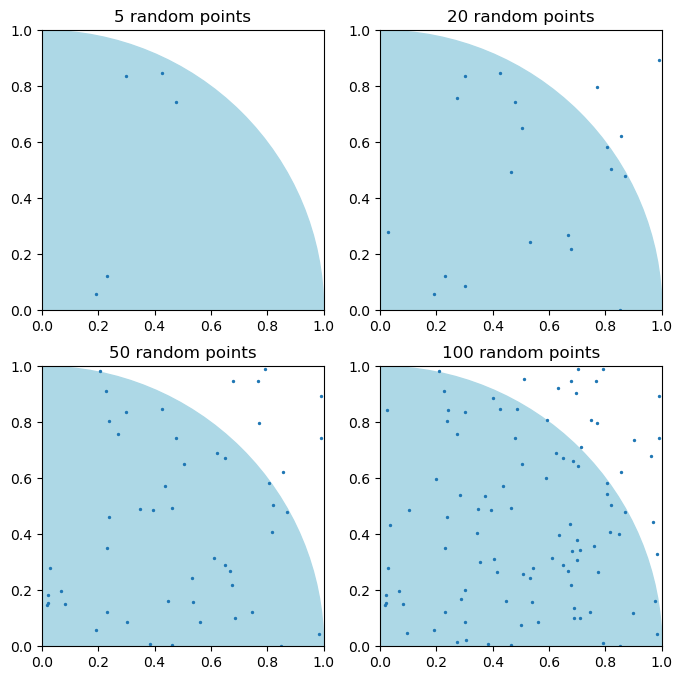

In [29]:
# You don't need to understand this code - 
# run this cell just for visualization purposes!
random.seed(161)

size = 100
xs = np.random.uniform(0, 1, size = size)
ys = np.random.uniform(0, 1, size = size)

fig, axs = plt.subplots(2,2, figsize=(8,8))

axs_indeces = [(0,0), (0,1), (1,0), (1,1)]

for i in axs_indeces:
    axs[i].add_patch(plt.Circle([0,0], 1, color="lightblue"))
    axs[i].set_xlim([0,1])
    axs[i].set_ylim([0,1])

for i, nr_points in zip(axs_indeces, [5,20,50,100]):
    axs[i].scatter(x = xs[:nr_points], y = ys[:nr_points], s = 2)
    axs[i].set_title(f"{nr_points} random points")


***

# Introduction to environment management with `conda`

(cf slides)

***

Trying to run [GeoPandas](https://geopandas.org/en/stable/), the Python package for geospatial data.

```python
import geopandas as gpd
gdf = gpd.read_file("map.gpkg")
gdf.plot(figsize=(15,15))
```

In [ ]:
# running this cell won't work at first - 
# unless you already had geopandas installed.
import geopandas as gpd
gdf = gpd.read_file("map.gpkg")
gdf.plot(figsize=(15,15))
# let's use conda to fix this!

# Try it out yourself!

1. Open up your CLI.
2. Create a new conda environment, `geotest`.
3. Activate the `geotest` environment.
3. Install, in the `geotest` environment, the following packages: `jupyter`, `ipykernel`, `pandas`, `geopandas`.
4. Run this notebook with the `geotest` environment (+ change kernel!) - the following cell should now work:

In [ ]:
import geopandas as gpd
gdf = gpd.read_file("map.gpkg")
gdf.plot(figsize=(15,15))